# Autoencoder for feature highlighting ?

- http://cs.stanford.edu/people/karpathy/convnetjs/demo/autoencoder.html
- https://www.tensorflow.org/get_started/mnist/pros
- https://gertjanvandenburg.com/blog/autoencoder/

In [2]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import os

In [3]:
DATA_PATH = '/home/reflex/refleX/metadata/'
IMAGE_PATH = f'{DATA_PATH}labeled/original512/'
MODEL_HOME = '/home/reflex/refleX/results/autoencoder/'
TF_DATASET_PATH = f'{MODEL_HOME}dataset'

In [133]:
BATCH_SIZE = 1
LEARNING_RATE = 1e-4
NUM_BATCHES = 16
NUM_TESTING_EXAMPLES = 32
NUM_ITERATIONS = 512
IMAGE_SIZE = 512
USE_RELU = False
USE_CACHED = False

## Tensorboard helper functions

In [123]:
# TODO

## Define network architecture

- FC1, 50 neurons, tanh
- FC2, 50 neurons, tanh
- FC3, 2 neurons
- FC4, 50 neurons, tanh
- FC5 50 neurons, tanh
- readout layer

TODO: convolutions instead of fc layers

In [163]:
def fc_layer(previous, input_size, output_size, name_prefix=''):
    W = tf.get_variable(name=name_prefix+'_W', initializer=tf.truncated_normal(shape=[input_size, output_size], stddev=0.1))
    b = tf.get_variable(name=name_prefix+'_b', initializer=tf.truncated_normal(shape=[output_size]))
    return tf.matmul(previous, W) + b

In [164]:
def autoencoder(x):
    
    l1 = tf.nn.tanh(fc_layer(x, IMAGE_SIZE*IMAGE_SIZE, 10, 'l1'))
    l2 = tf.nn.tanh(fc_layer(l1, 10, 10, 'l2'))
    l3 = fc_layer(l2, 10, 10, 'l3')
    l4 = tf.nn.tanh(fc_layer(l3, 10, 10, 'l4'))
    #l5 = tf.nn.tanh(fc_layer(l4, 10, 10, 'l5'))
    if USE_RELU:
        out = tf.nn.relu(fc_layer(l4, 10, IMAGE_SIZE*IMAGE_SIZE, 'out'))
    else:
        out = fc_layer(l4, 10, IMAGE_SIZE*IMAGE_SIZE, 'out')

    loss = tf.losses.mean_squared_error(x, out)
    return loss, out, l3

## Run model

### Load data

In [165]:
if USE_CACHED:
    with np.load("/var/data/training_data.npy") as data:
        features = data["features"]
        labels = data["labels"]

else:
    images = np.ndarray(shape=(NUM_BATCHES*BATCH_SIZE, IMAGE_SIZE*IMAGE_SIZE), dtype=np.float32)
    for i, imname in enumerate(os.listdir(IMAGE_PATH)[:NUM_BATCHES*BATCH_SIZE]):
        images[i] = plt.imread(f'{IMAGE_PATH}{imname}').astype(np.float32).flatten()
    features = np.reshape(images, (NUM_BATCHES, BATCH_SIZE, IMAGE_SIZE*IMAGE_SIZE))
    labels = None # TODO
    # TODO save as with training_data.npy
    
    test_images = np.ndarray(shape=(NUM_TESTING_EXAMPLES, IMAGE_SIZE*IMAGE_SIZE), dtype=np.float32)
    for i, imname in enumerate(os.listdir(IMAGE_PATH)[NUM_BATCHES*BATCH_SIZE:NUM_BATCHES*BATCH_SIZE+NUM_TESTING_EXAMPLES]):
        test_images[i] = plt.imread(f'{IMAGE_PATH}{imname}').astype(np.float32).flatten()

#assert features.shape[0] == labels.shape[0] # TODO uncomment
#assert features.shape[-1] == features.shape[-2] # for square images only

test_images = features # FIXME remove

print(features.shape)
print(test_images.shape)

(16, 1, 262144)
(16, 1, 262144)


### Training

[[-1.0544906  -1.1112299   0.18436345 -0.64884007 -0.62190044  0.47776663
  -0.13329417  0.3596346  -0.06210245  2.0756536 ]]


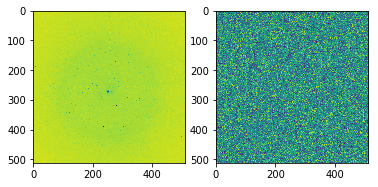

[[-1.0530145  -1.1104192   0.18333104 -0.6497154  -0.62226677  0.47694185
  -0.13247992  0.3605274  -0.06177753  2.0755072 ]]


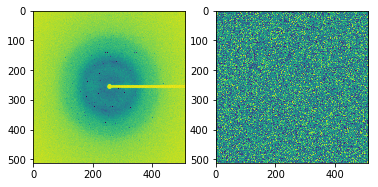

[[-1.0495794  -1.1101701   0.17959183 -0.64890635 -0.6224695   0.47541904
  -0.13258328  0.36029068 -0.06319706  2.077081  ]]


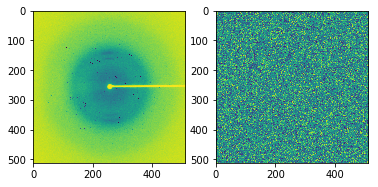

[[-1.0049621  -1.1184762   0.1336891  -0.63010037 -0.61406773  0.46611965
  -0.14830974  0.34222895 -0.09428512  2.1058488 ]]


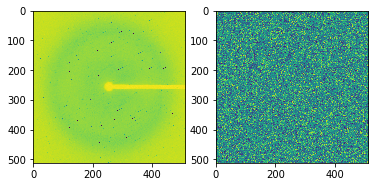

[[-1.0036947  -1.1178733   0.13272871 -0.6306666  -0.61470324  0.46508005
  -0.14750987  0.3427052  -0.09377255  2.1055608 ]]


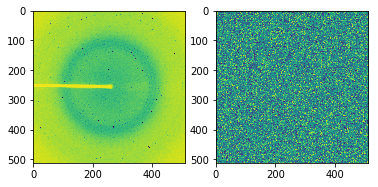

[[-1.002658   -1.117206    0.13197052 -0.63130045 -0.61539066  0.46406296
  -0.14662403  0.34330493 -0.09330814  2.1051602 ]]


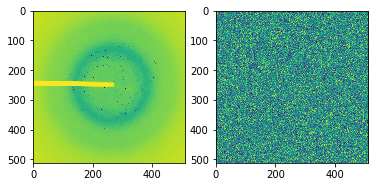

[[-1.0016294  -1.1165068   0.13118932 -0.6318956  -0.6160793   0.4630147
  -0.14573967  0.3439356  -0.09305442  2.1048002 ]]


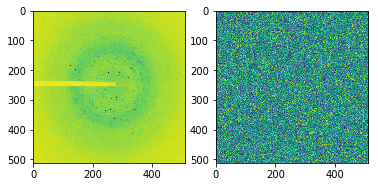

[[-1.0016372  -1.1142379   0.12941019 -0.63039833 -0.6167119   0.4607887
  -0.1448842   0.34627187 -0.09321731  2.1064878 ]]


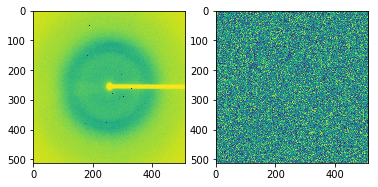

[[-1.010963   -1.0934145   0.11773257 -0.605445   -0.6141419   0.4451174
  -0.144965    0.3661561  -0.09170321  2.1287649 ]]


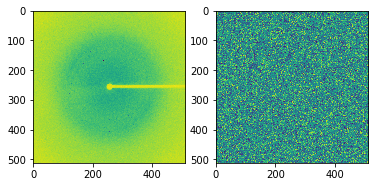

[[-1.0099874  -1.0927413   0.11699957 -0.60606    -0.6148202   0.4441508
  -0.14415315  0.3667667  -0.09191233  2.1283002 ]]


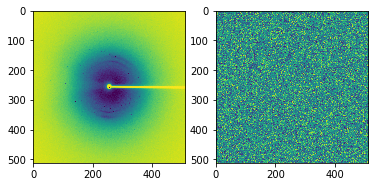

[[-1.009001   -1.0920653   0.11626422 -0.606674   -0.61549824  0.44317514
  -0.1433495   0.3673754  -0.09218175  2.1278381 ]]


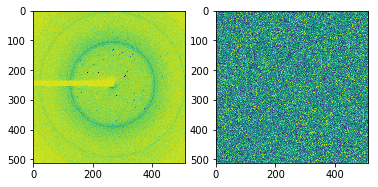

[[-1.008008   -1.0913897   0.11552942 -0.6072775  -0.61617255  0.44219506
  -0.14256927  0.3679772  -0.09249863  2.1273785 ]]


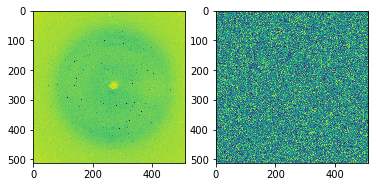

[[-1.0070114  -1.0907153   0.11479665 -0.60786885 -0.6168414   0.44121376
  -0.14182016  0.36857033 -0.09285227  2.1269217 ]]


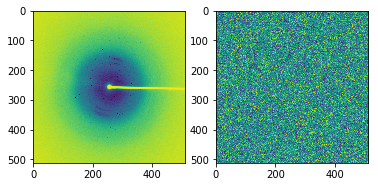

[[-1.0060133  -1.0900426   0.11406638 -0.60845256 -0.6175041   0.44023314
  -0.14110062  0.36915547 -0.09323554  2.1264677 ]]


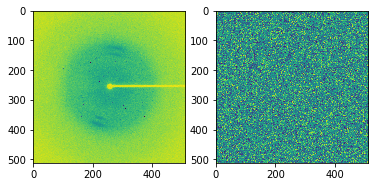

[[-1.0050156  -1.0893731   0.11334066 -0.6090196  -0.61815804  0.43925607
  -0.14042658  0.36972836 -0.09364432  2.1260173 ]]


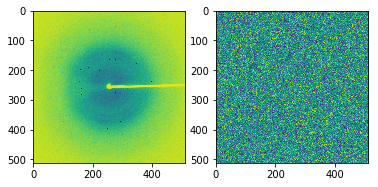

[[-1.0040201  -1.0887076   0.11262023 -0.6095703  -0.6188018   0.43828455
  -0.13980229  0.3702884  -0.09407552  2.12557   ]]


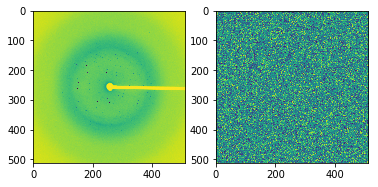

Iteration 0: loss=1.4267116785049438
[[-2.231061   -2.336008    1.3622915  -1.6513059  -1.7061464   1.8078651
  -1.6184921   0.05163865 -1.7289658   3.6204894 ]]


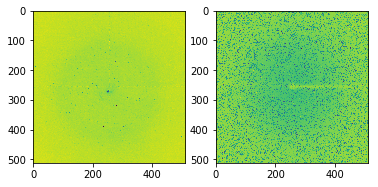

[[-2.2312517  -2.3362145   1.3625077  -1.6516333  -1.7064338   1.8080682
  -1.6187      0.05167172 -1.7291968   3.6207232 ]]


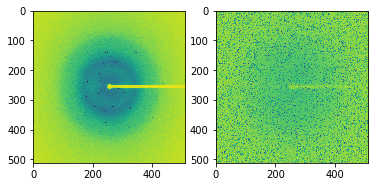

[[-2.2314413  -2.3364196   1.3627225  -1.6519582  -1.7067192   1.8082695
  -1.6189064   0.05170462 -1.7294263   3.6209552 ]]


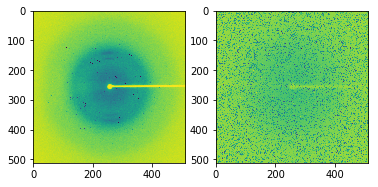

[[-2.2316294  -2.336623    1.3629358  -1.652281   -1.707003    1.8084698
  -1.6191113   0.05173732 -1.7296542   3.6211858 ]]


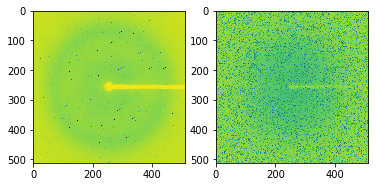

[[-2.2318187  -2.3368273   1.3631501  -1.6526054  -1.7072878   1.8086708
  -1.6193173   0.05177018 -1.729883    3.621417  ]]


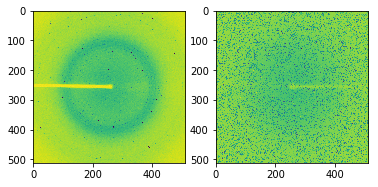

[[-2.2320092  -2.3370333   1.3633659  -1.6529318  -1.7075746   1.8088729
  -1.6195247   0.05180328 -1.7301135   3.6216502 ]]


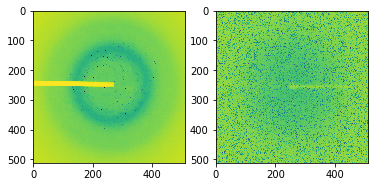

[[-2.2321994 -2.3372388  1.3635817 -1.6532583 -1.7078614  1.8090754
  -1.6197319  0.0518364 -1.7303438  3.621883 ]]


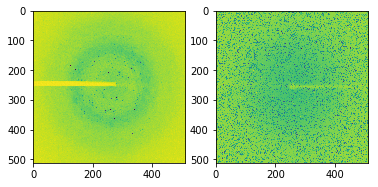

[[-2.23239    -2.3374448   1.3637974  -1.6535852  -1.7081484   1.8092777
  -1.6199394   0.05186956 -1.7305745   3.622116  ]]


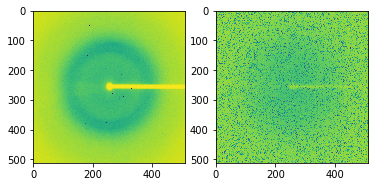

[[-2.2325811  -2.3376515   1.3640141  -1.653913   -1.7084365   1.8094808
  -1.6201475   0.05190283 -1.7308059   3.6223502 ]]


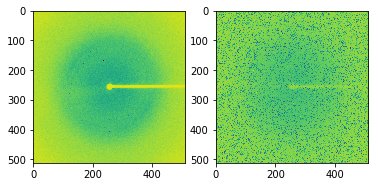

[[-2.2327724  -2.3378582   1.3642309  -1.6542411  -1.7087247   1.8096842
  -1.6203561   0.05193612 -1.7310374   3.6225843 ]]


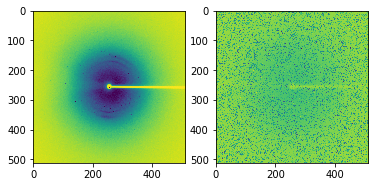

[[-2.2329607  -2.3380613   1.3644439  -1.6545637  -1.709008    1.809884
  -1.6205608   0.05196895 -1.731265    3.6228144 ]]


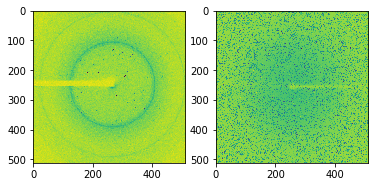

[[-2.23315    -2.338266    1.3646584  -1.6548883  -1.7092931   1.8100848
  -1.6207666   0.05200191 -1.7314937   3.623046  ]]


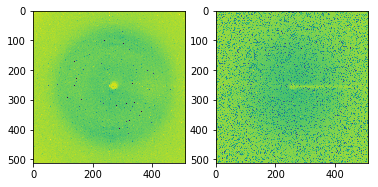

[[-2.2333398  -2.338471    1.3648736  -1.6552143  -1.7095795   1.8102868
  -1.6209736   0.05203504 -1.7317238   3.6232781 ]]


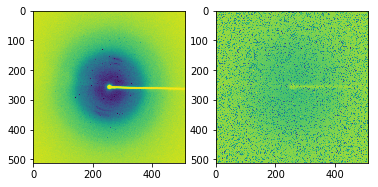

[[-2.233527   -2.3386736   1.3650856  -1.6555353  -1.7098616   1.8104856
  -1.6211772   0.05206772 -1.7319503   3.6235075 ]]


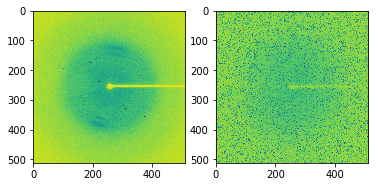

[[-2.2337139 -2.3388753  1.3652976 -1.6558564 -1.7101434  1.8106842
  -1.6213808  0.0521004 -1.7321765  3.6237364]]


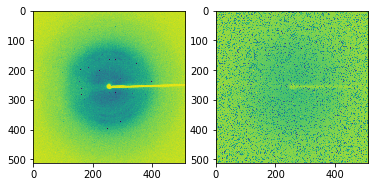

[[-2.2339     -2.339076    1.3655082  -1.6561754  -1.7104237   1.8108819
  -1.6215831   0.05213291 -1.7324016   3.6239634 ]]


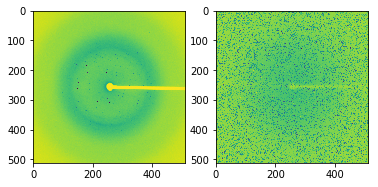

Iteration 100: loss=0.07998146116733551
[[-2.3687706  -2.4836388   1.5189763  -1.8946772  -1.9197793   1.9535234
  -1.7674376   0.08118927 -1.8955592   3.787477  ]]


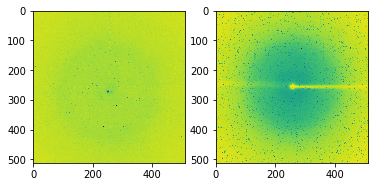

[[-2.3687987  -2.4836693   1.5190086  -1.8947287  -1.9198244   1.9535532
  -1.7674682   0.08119664 -1.8955936   3.7875113 ]]


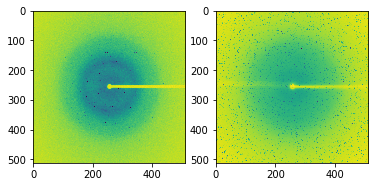

[[-2.368826   -2.483698    1.5190394  -1.8947777  -1.9198672   1.9535815
  -1.7674971   0.08120364 -1.895626    3.7875433 ]]


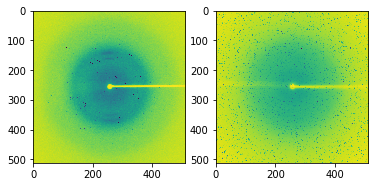

[[-2.3688512  -2.4837248   1.5190685  -1.894824   -1.9199078   1.9536083
  -1.7675242   0.08121036 -1.8956568   3.787574  ]]


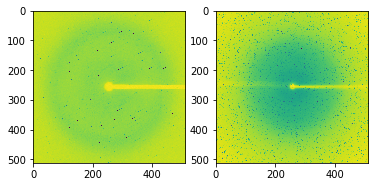

[[-2.3688781  -2.4837532   1.5190991  -1.8948729  -1.9199507   1.9536365
  -1.7675531   0.08121739 -1.8956891   3.7876062 ]]


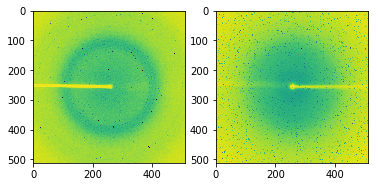

[[-2.368907  -2.4837837  1.519132  -1.8949254 -1.9199967  1.9536668
  -1.7675838  0.0812249 -1.8957238  3.7876406]]


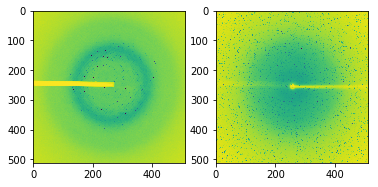

[[-2.3689358  -2.4838147   1.5191652  -1.8949784  -1.9200431   1.9536973
  -1.7676152   0.08123244 -1.8957591   3.7876759 ]]


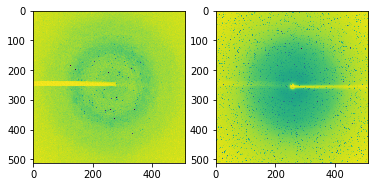

[[-2.3689654  -2.483846    1.5191988  -1.8950322  -1.9200902   1.9537284
  -1.7676467   0.08124013 -1.8957946   3.787711  ]]


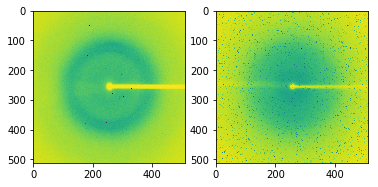

[[-2.368996   -2.4838786   1.5192338  -1.895088   -1.9201392   1.9537606
  -1.7676797   0.08124808 -1.8958317   3.7877479 ]]


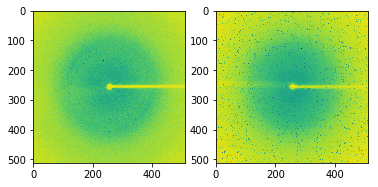

[[-2.369027   -2.4839115   1.5192692  -1.8951446  -1.9201887   1.9537932
  -1.7677131   0.08125608 -1.8958693   3.787785  ]]


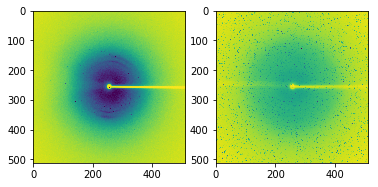

[[-2.369054   -2.4839406   1.5193003  -1.895194   -1.9202323   1.9538218
  -1.7677422   0.08126323 -1.8959019   3.787818  ]]


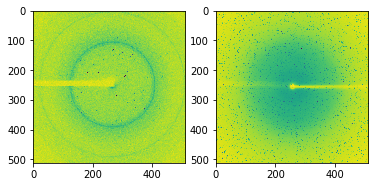

[[-2.369083   -2.483971    1.5193331  -1.8952465  -1.9202781   1.9538522
  -1.7677729   0.08127074 -1.8959367   3.7878523 ]]


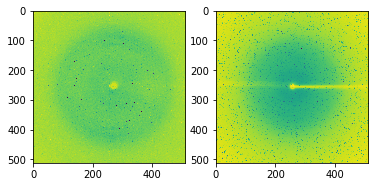

[[-2.369113   -2.484003    1.5193677  -1.8953016  -1.9203265   1.9538839
  -1.7678055   0.08127852 -1.8959733   3.7878885 ]]


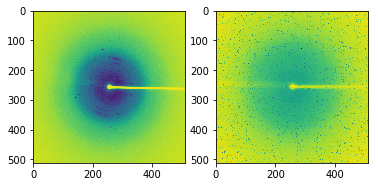

[[-2.3691394  -2.4840314   1.519398   -1.8953502  -1.9203688   1.9539118
  -1.7678338   0.08128551 -1.8960054   3.7879205 ]]


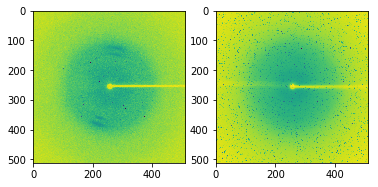

[[-2.3691664  -2.4840598   1.5194287  -1.8953989  -1.9204116   1.95394
  -1.7678628   0.08129252 -1.8960378   3.787953  ]]


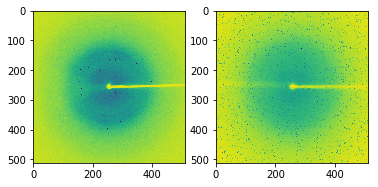

[[-2.3691916  -2.484087    1.5194577  -1.8954453  -1.9204524   1.9539669
  -1.7678901   0.08129926 -1.8960687   3.7879834 ]]


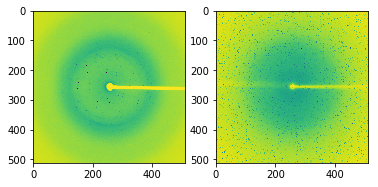

Iteration 200: loss=0.007145409472286701
[[-2.3854668  -2.5013905   1.5380806  -1.9252746  -1.9465747   1.9710968
  -1.7853544   0.08566861 -1.9157573   3.8075304 ]]


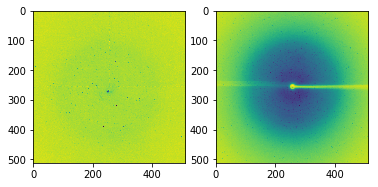

[[-2.3854682  -2.5013921   1.5380824  -1.9252772  -1.9465771   1.9710983
  -1.7853558   0.08566896 -1.9157592   3.807532  ]]


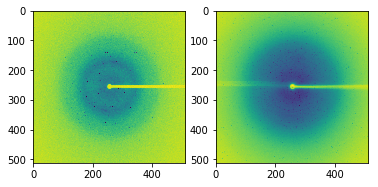

[[-2.3854668  -2.5013907   1.5380807  -1.9252746  -1.9465747   1.9710969
  -1.7853543   0.08566864 -1.9157573   3.8075304 ]]


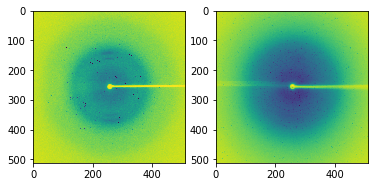

[[-2.3854623  -2.5013857   1.5380756  -1.9252665  -1.9465674   1.9710922
  -1.7853494   0.08566764 -1.9157519   3.8075252 ]]


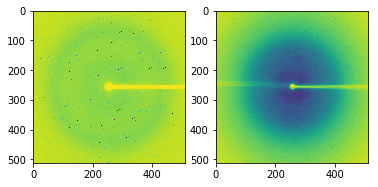

[[-2.3854609  -2.5013845   1.538074   -1.9252641  -1.9465652   1.9710908
  -1.7853479   0.08566732 -1.9157501   3.8075233 ]]


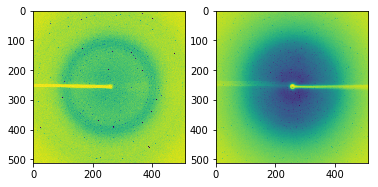

[[-2.3854635 -2.5013871  1.5380769 -1.9252689 -1.9465694  1.9710934
  -1.7853508  0.085668  -1.9157534  3.8075266]]


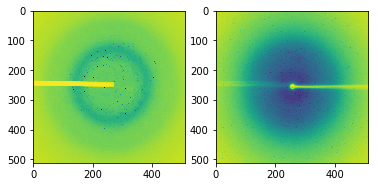

[[-2.385467   -2.501391    1.538081   -1.9252753  -1.9465752   1.9710971
  -1.7853546   0.08566891 -1.9157577   3.8075306 ]]


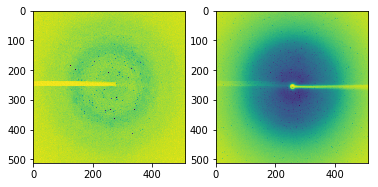

[[-2.3854713  -2.5013957   1.5380859  -1.9252832  -1.9465821   1.9711018
  -1.7853593   0.08567008 -1.915763    3.807536  ]]


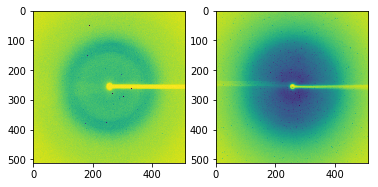

[[-2.385478  -2.5014029  1.5380938 -1.9252958 -1.9465932  1.9711088
  -1.7853665  0.0856718 -1.9157711  3.807544 ]]


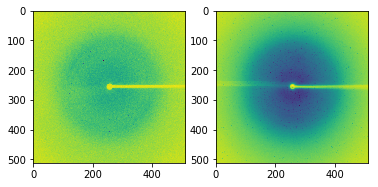

[[-2.385486   -2.501411    1.5381029  -1.9253101  -1.9466057   1.971117
  -1.7853751   0.08567372 -1.9157808   3.8075535 ]]


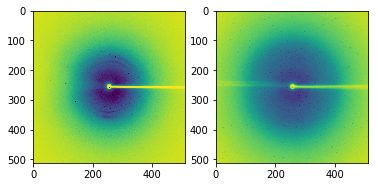

[[-2.3854854  -2.5014107   1.5381025  -1.9253095  -1.9466052   1.9711168
  -1.7853746   0.08567372 -1.9157804   3.8075533 ]]


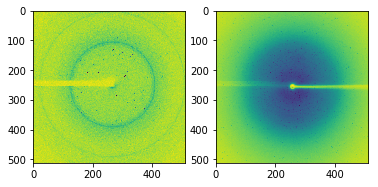

[[-2.3854887  -2.501414    1.5381061  -1.9253153  -1.9466105   1.9711202
  -1.7853781   0.08567455 -1.9157841   3.807557  ]]


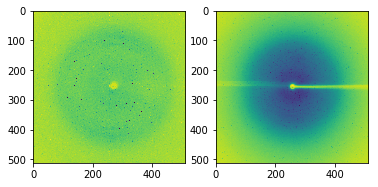

[[-2.3854947  -2.5014205   1.5381131  -1.9253268  -1.9466205   1.9711267
  -1.785385    0.08567609 -1.9157917   3.8075643 ]]


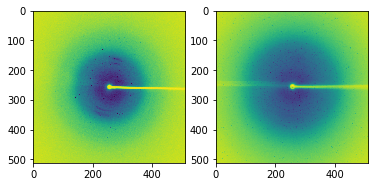

[[-2.3854938  -2.5014193   1.5381117  -1.9253246  -1.9466186   1.9711256
  -1.7853837   0.08567584 -1.9157902   3.8075628 ]]


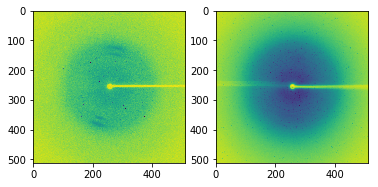

[[-2.385493   -2.5014186   1.5381109  -1.9253232  -1.9466171   1.9711246
  -1.7853827   0.08567569 -1.9157894   3.8075619 ]]


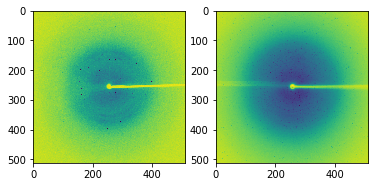

[[-2.3854897  -2.501415    1.5381072  -1.9253172  -1.9466119   1.9711212
  -1.785379    0.08567494 -1.9157853   3.807558  ]]


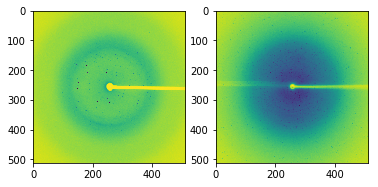

Iteration 300: loss=0.005484041292220354
[[-2.3859773  -2.5019355   1.5386672  -1.9262143  -1.947399    1.9716355
  -1.7859039   0.08580776 -1.9163774   3.808142  ]]


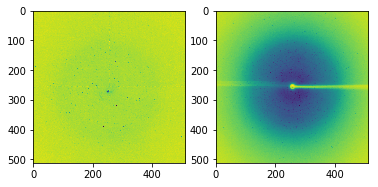

[[-2.3859773  -2.5019355   1.5386672  -1.9262141  -1.947399    1.9716353
  -1.7859039   0.08580764 -1.9163774   3.808142  ]]


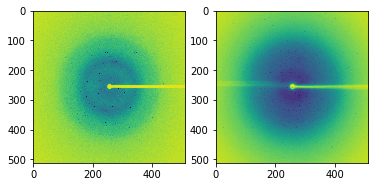

[[-2.3859706  -2.5019283   1.5386596  -1.9262018  -1.9473882   1.9716283
  -1.7858967   0.08580595 -1.9163692   3.8081338 ]]


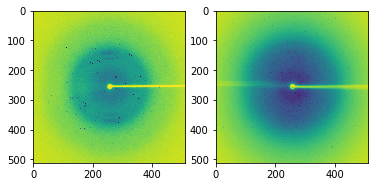

[[-2.3859575  -2.5019145   1.5386446  -1.9261782  -1.9473671   1.9716147
  -1.7858825   0.08580279 -1.9163532   3.808118  ]]


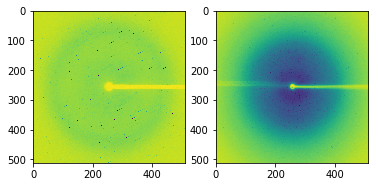

[[-2.385951   -2.5019078   1.5386369  -1.9261663  -1.9473566   1.9716079
  -1.7858756   0.08580117 -1.9163455   3.8081102 ]]


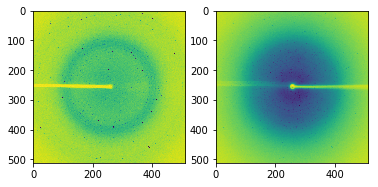

[[-2.3859534 -2.5019104  1.5386398 -1.9261708 -1.9473608  1.9716105
  -1.7858784  0.0858018 -1.9163485  3.8081133]]


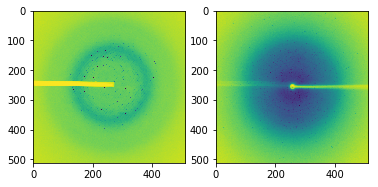

[[-2.3859577  -2.5019152   1.5386448  -1.9261788  -1.9473679   1.9716151
  -1.7858831   0.08580291 -1.9163538   3.8081183 ]]


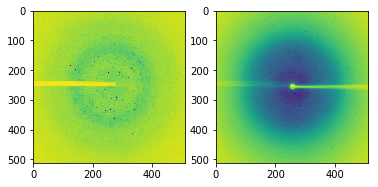

[[-2.3859642  -2.501922    1.5386524  -1.9261906  -1.9473779   1.9716218
  -1.7858901   0.08580454 -1.9163616   3.8081262 ]]


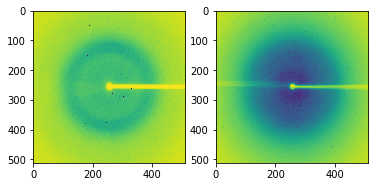

[[-2.3859758  -2.5019345   1.5386658  -1.9262121  -1.947397    1.9716343
  -1.7859027   0.08580744 -1.9163758   3.8081403 ]]


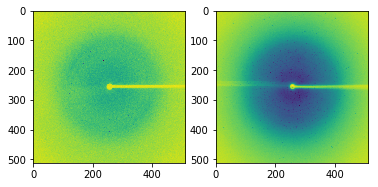

[[-2.38599    -2.5019493   1.5386817  -1.9262373  -1.9474196   1.9716487
  -1.7859179   0.08581084 -1.9163928   3.8081572 ]]


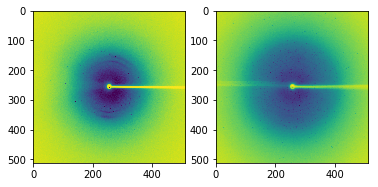

[[-2.3859859  -2.501945    1.5386772  -1.92623    -1.9474132   1.9716448
  -1.7859136   0.08580995 -1.916388    3.8081522 ]]


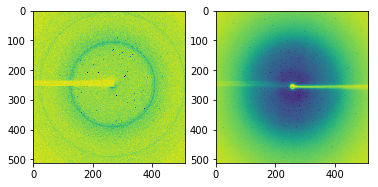

[[-2.38599   -2.501949   1.5386817 -1.9262371 -1.9474195  1.9716487
  -1.7859179  0.0858109 -1.9163926  3.808157 ]]


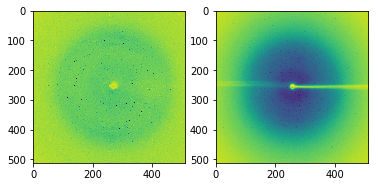

[[-2.3860002  -2.5019603   1.5386937  -1.9262562  -1.9474363   1.9716598
  -1.785929    0.08581339 -1.9164054   3.8081698 ]]


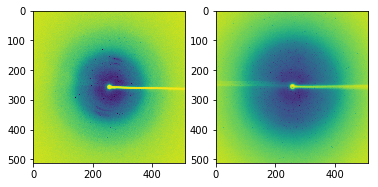

[[-2.3859944  -2.5019538   1.5386869  -1.9262457  -1.9474269   1.9716535
  -1.7859226   0.08581196 -1.9163985   3.8081627 ]]


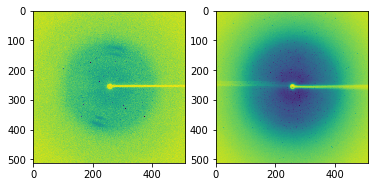

[[-2.3859894  -2.5019486   1.538681   -1.9262364  -1.9474187   1.9716485
  -1.7859173   0.08581072 -1.9163921   3.8081565 ]]


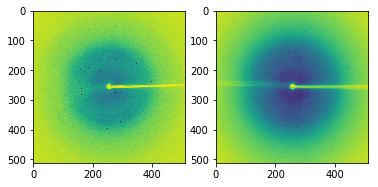

[[-2.3859787  -2.5019374   1.5386689  -1.9262171  -1.9474014   1.9716371
  -1.7859056   0.08580811 -1.9163791   3.8081436 ]]


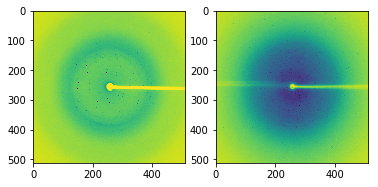

Iteration 400: loss=0.005481146275997162


KeyboardInterrupt: 

In [166]:
tf.reset_default_graph()

x = tf.placeholder(features.dtype, features.shape[-2:])
iterator = tf.data.Dataset.from_tensor_slices((x)).make_initializable_iterator()
loss, output, latent = autoencoder(x)

saver = tf.train.Saver()

with tf.Session() as sess:
    
    train_op = tf.train.AdamOptimizer(LEARNING_RATE).minimize(loss)
    sess.run(tf.global_variables_initializer())
    sess.run(iterator.initializer, feed_dict={x: features[0]})
    
    for iter_num in range(NUM_ITERATIONS):
        losses = []
        oo = None
        for batch_i in range(NUM_BATCHES):
            current_loss, _, oo, _lat = sess.run([loss, train_op, output, latent], feed_dict={ x: features[batch_i] })
            losses.append(current_loss)
            if iter_num%100 == 0:
                print(_lat)
                _, ax = plt.subplots(1,2)
                ax[0].imshow(features[batch_i].reshape(IMAGE_SIZE, IMAGE_SIZE))
                ax[1].imshow(oo.reshape(IMAGE_SIZE, IMAGE_SIZE))
                plt.show()
        if iter_num%100 == 0:
            print(f'Iteration {iter_num}: loss={np.mean(losses)}')

    print(f'Saved model in {saver.save(sess, "./TEMP")}')

### Restore session & test

INFO:tensorflow:Restoring parameters from ./TEMP
Model restored.
[[ 4.4693494 -1.4379312]]
0.052044373


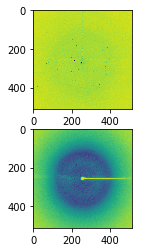

[[ 4.4693494 -1.4379312]]
0.04457788


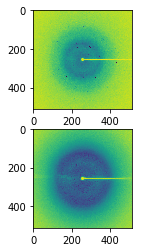

[[ 4.4693494 -1.4379312]]
0.044644427


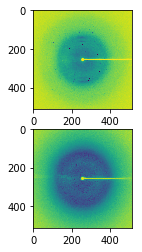

[[ 4.4693494 -1.4379312]]
0.044950273


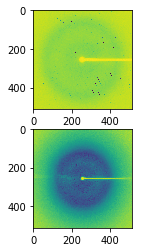

[[ 4.4693494 -1.4379312]]
0.025712732


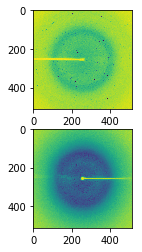

[[ 4.4693494 -1.4379312]]
0.023666577


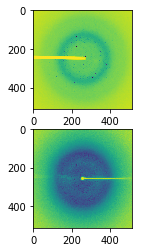

[[ 4.4693494 -1.4379312]]
0.03432503


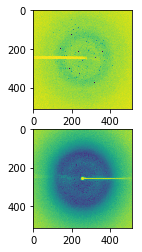

[[ 4.4693494 -1.4379312]]
0.018957507


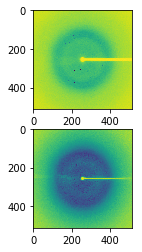

[[ 4.4693494 -1.4379312]]
0.01791992


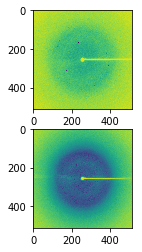

[[ 4.4693494 -1.4379312]]
0.08678408


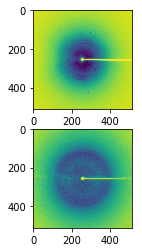

[[ 4.4693494 -1.4379312]]
0.046323758


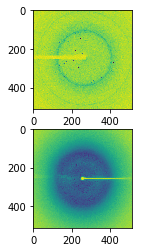

[[ 4.4693494 -1.4379312]]
0.032197773


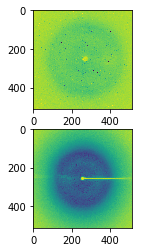

[[ 4.4693494 -1.4379312]]
0.07379957


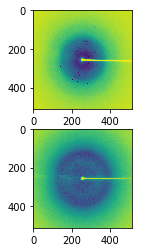

[[ 4.4693494 -1.4379312]]
0.021242592


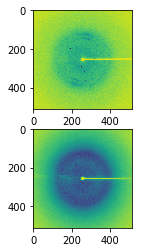

[[ 4.4693494 -1.4379312]]
0.043726966


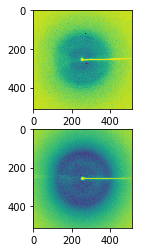

[[ 4.4693494 -1.4379312]]
0.019467663


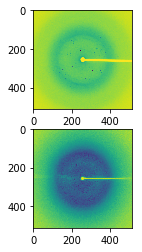

In [147]:
tf.reset_default_graph()

x = tf.placeholder(test_images.dtype, test_images.shape[-2:])
loss, output, latent = autoencoder(x)

with tf.Session() as sess:
    tf.train.Saver().restore(sess, "./TEMP")
    print("Model restored.")2
    for im in test_images:
        latent_res, output_res, loss_res = sess.run([latent, output, loss], feed_dict={x : im}) 
        print(latent_res)
        print(loss_res)
        _, ax = plt.subplots(2,1)
        ax[0].imshow(im.reshape(IMAGE_SIZE, IMAGE_SIZE))
        ax[1].imshow(output_res.reshape(IMAGE_SIZE, IMAGE_SIZE))
        plt.show()